In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle
import seaborn as sns

%matplotlib inline

pd.options.display.max_rows = None
pd.options.display.max_columns = None
pd.options.display.float_format = '{:20,.2f}'.format

In [2]:
with open('cast_data.pkl', 'rb') as picklefile:
    cast = pickle.load(picklefile)
with open('prod_cast_data.pkl', 'rb') as picklefile:
    prod_cast = pickle.load(picklefile)
with open('summary_data.pkl', 'rb') as picklefile:
    summary = pickle.load(picklefile)
with open('budget_data.pkl', 'rb') as picklefile:
    budget = pickle.load(picklefile)
    
yearly_cpi = pd.read_csv('yearly_cpi.csv')
yearly_cpi.index = yearly_cpi.Year
yearly_cpi.drop('Year', axis=1, inplace=True)
yearly_cpi.columns = ['cpi']

In [50]:
budget.head(10)

,releasedate,movie,budget,domgross,intgross,url,releaseyear
0,2009-12-18,Avatar,425000000,760507625,2783918982,/movie/Avatar#tab=summary,2009
1,2015-12-18,Star Wars Ep. VII: The Force Awakens,306000000,936662225,2058662225,/movie/Star-Wars-Ep-VII-The-Force-Awakens#tab=...,2015
2,2007-05-24,Pirates of the Caribbean: At World's End,300000000,309420425,963420425,/movie/Pirates-of-the-Caribbean-At-Worlds-End#...,2007
3,2015-11-06,Spectre,300000000,200074175,879620923,/movie/Spectre#tab=summary,2015
4,2012-07-20,The Dark Knight Rises,275000000,448139099,1084439099,/movie/Dark-Knight-Rises-The#tab=summary,2012
5,2013-07-02,The Lone Ranger,275000000,89302115,260002115,/movie/Lone-Ranger-The#tab=summary,2013
6,2012-03-09,John Carter,275000000,73058679,282778100,/movie/John-Carter-of-Mars#tab=summary,2012
7,2010-11-24,Tangled,260000000,200821936,586581936,/movie/Tangled#tab=summary,2010
8,2007-05-04,Spider-Man 3,258000000,336530303,890875303,/movie/Spider-Man-3#tab=summary,2007
9,2015-05-01,Avengers: Age of Ultron,250000000,459005868,1404705868,/movie/Avengers-Age-of-Ultron#tab=summary,2015


In [51]:
cast.head(10)

,cast_id,name
0,154880401,Sam Worthington
0,126330401,Zoe Saldana
0,800401,Sigourney Weaver
0,81830401,Stephen Lang
0,123210401,Michelle Rodriguez
0,120780401,Giovanni Ribisi
0,101320401,Joel Moore
0,116040401,CCH Pounder
0,138510401,Wes Studi
0,4150401,Laz Alonso


In [52]:
prod_cast.head(10)

,cast_id,name,job
0,23100401,James Cameron,Director
0,23100401,James Cameron,Screenwriter
0,23100401,James Cameron,Producer
0,190420401,Jon Landau,Producer
0,206830401,Colin Wilson,Executive Producer
0,423570401,Laeta Kalogridis,Executive Producer
1,2080401,J.J. Abrams,Director
1,2080401,J.J. Abrams,Screenwriter
1,75290401,Lawrence Kasdan,Screenwriter
1,203750401,Michael Arndt,Screenwriter


In [53]:
summary.head(10)

,rating,runtime,genre,franchise,prod_method,prod_comp,prod_nat
0,\nPG-13 for intense epic battle sequences and ...,\n162 minutes,Action,\nAvatar,Animation/Live Action,"\nDune Entertainment, 20th Century Fox, Ingeni...",\nUnited States
1,\nPG-13 for sci-fi action violence.(Rating bul...,\n136 minutes,Adventure,\nStar Wars,Animation/Live Action,"\nLucasfilm, Bad Robot",\nUnited States
2,\nPG-13 for intense sequences of action/advent...,\n167 minutes,Adventure,\nPirates of the Caribbean,Live Action,"\nWalt Disney Pictures, Jerry Bruckheimer",\nUnited States
3,\nPG-13 for intense sequences of action and vi...,\n148 minutes,Action,\nJames Bond,Live Action,\nEon Productions,"\nUnited Kingdom,United States"
4,\nPG-13 for intense sequences of violence and ...,\n164 minutes,Action,\nBatmanDark Knight Trilogy,Live Action,"\nWarner Bros., Legendary Pictures, Syncopy",\nUnited States
5,\nPG-13 for sequences of intense action and vi...,\n149 minutes,Western,,Live Action,"\nWalt Disney Pictures, Jerry Bruckheimer, Bli...",\nUnited States
6,\nPG-13 for intense sequences of violence and ...,\n132 minutes,Adventure,,Live Action,"\nWalt Disney Pictures, Jim Morris",\nUnited States
7,\nPG for brief mild violence(Rating bulletin 2...,\n101 minutes,Adventure,,Digital Animation,\nWalt Disney Animation Studios,\nUnited States
8,\nPG-13 for sequences of intense action violence,\n139 minutes,Adventure,\nSpider-Man,Live Action,"\nColumbia Pictures, Marvel Studios, Laura Zis...",\nUnited States
9,\nPG-13 for intense sequences of sci-fi action...,\n141 minutes,Action,\nMarvel Cinematic Universe,Live Action,\nMarvel Studios,\nUnited States


In [64]:
movies[movies.releasedate == '1915-02-08']

,releasedate,movie,budget,domgross,intgross,url,releaseyear,rating,runtime,genre,franchise,prod_method,rating_desc,intgross_adj,budget_adj,intgross_log,budget_log,profit,releasemonth,releasewk,releasemonth_bi,re_wk_prof,re_mo_prof,cast_size,cast_size_log,cast_score,top_prod_nat,top_prod_comp,prod_comp_prof,prod_cast_size,prod_cast_score,prod_cast_score_log
5188,1915-02-08,The Birth of a Nation,110000,10000000,11000000,/movie/Birth-of-a-Nation-The#tab=summary,1915,NaN,nan,Drama,,Live Action,NaN,"261,386,138.61","2,613,861.39",19.38,14.78,4.61,2,6,0.00,0.58,0.37,nan,nan,nan,nan,NaN,nan,nan,nan,nan


In [3]:
# DATA CLEANING
# Delete movies that haven't been released yet
budget = budget[budget.releasedate <= '2016-12-01']
summary = summary[summary.index.isin(budget.index)]
cast = cast[cast.index.isin(budget.index)]
prod_cast = prod_cast[prod_cast.index.isin(budget.index)]

In [4]:
# Clean summary
summary['rating_desc'] = summary.rating.str.extract(r'((?<=for ).*?(?=\()|(?<=for ).*)', expand=False)
summary.rating = summary.rating.str.extract('(G|PG-13|PG|R|NC-17|Not Rated)', expand=False)
summary.runtime = pd.to_numeric(summary.runtime.str.extract(r'([0-9]+)', expand=False))
summary.franchise = summary.franchise.str.replace(r'\n', '')
summary.prod_method = summary.prod_method.replace('', np.nan)
summary.prod_comp = summary.prod_comp.str.replace('\n', '')
summary.prod_nat = summary.prod_nat.str.replace('\n', '')
summary.genre = summary.genre.replace('', np.nan)

In [113]:
movies.head()

,releasedate,movie,budget,domgross,intgross,url,releaseyear,rating,runtime,genre,franchise,prod_method,rating_desc,intgross_adj,budget_adj,intgross_log,budget_log,profit,releasemonth,releasewk,releasemonth_bi,re_wk_prof,re_mo_prof,cast_size,cast_size_log,cast_score,top_prod_nat,top_prod_comp,prod_comp_prof,prod_cast_size,prod_cast_score,prod_cast_score_log
0,2009-12-18,Avatar,425000000,760507625,2783918982,/movie/Avatar#tab=summary,2009,PG,162.00,Action,Avatar,Animation/Live Action,"intense epic battle sequences and warfare, sen...","3,114,337,180.44","475,442,464.47",21.86,19.98,1.88,12,50,1.00,0.89,0.63,40.00,3.69,5.35,1.00,20th Century Fox,1.19,6.00,15.17,2.72
1,2015-12-18,Star Wars Ep. VII: The Force Awakens,306000000,936662225,2058662225,/movie/Star-Wars-Ep-VII-The-Force-Awakens#tab=...,2015,PG,136.00,Adventure,Star Wars,Animation/Live Action,sci-fi action violence.,"2,084,571,714.27","309,851,192.11",21.46,19.55,1.91,12,50,1.00,0.89,0.63,39.00,3.66,7.67,1.00,Lucasfilm,1.43,9.00,14.00,2.64
2,2007-05-24,Pirates of the Caribbean: At World's End,300000000,309420425,963420425,/movie/Pirates-of-the-Caribbean-At-Worlds-End#...,2007,PG,167.00,Adventure,Pirates of the Caribbean,Live Action,intense sequences of action/adventure violence...,"1,115,392,677.28","347,322,720.69",20.83,19.67,1.17,5,21,1.00,0.87,0.39,22.00,3.09,14.32,1.00,Walt Disney Pictures,0.85,8.00,15.00,2.71
3,2015-11-06,Spectre,300000000,200074175,879620923,/movie/Spectre#tab=summary,2015,PG,148.00,Action,James Bond,Live Action,"intense sequences of action and violence, some...","890,691,475.80","303,775,678.54",20.61,19.53,1.08,11,44,1.00,0.52,0.55,77.00,4.34,2.45,1.00,Eon Productions,0.80,8.00,8.38,2.13
4,2012-07-20,The Dark Knight Rises,275000000,448139099,1084439099,/movie/Dark-Knight-Rises-The#tab=summary,2012,PG,164.00,Action,BatmanDark Knight Trilogy,Live Action,"intense sequences of violence and action, some...","1,133,589,657.22","287,463,958.12",20.85,19.48,1.37,7,29,1.00,0.49,0.61,14.00,2.64,22.07,1.00,Warner Bros.,1.57,10.00,16.10,2.78


In [5]:
# Create new table of production companies for each movie
prod_comps1 = summary.prod_comp.str.split(', ', expand=True)

prod_comps = prod_comps1.stack().reset_index()
prod_comps.columns = ['movie_index', 'level_1', 'prod_comp']
prod_comps.set_index(prod_comps.movie_index, inplace=True)
prod_comps.drop(['movie_index', 'level_1'], axis = 1, inplace=True)
prod_comps = prod_comps[prod_comps.prod_comp != '']

In [6]:
# Create new table of production countries for each movie
prod_nats1 = summary.prod_nat.str.split(',', expand=True)

prod_nats = prod_nats1.stack().reset_index()
prod_nats.columns = ['movie_index', 'level_1', 'prod_nat']
prod_nats.set_index(prod_nats.movie_index, inplace=True)
prod_nats.drop(['movie_index', 'level_1'], axis = 1, inplace=True)
prod_nats = prod_nats[prod_nats.prod_nat != '']

# Delete extraneous 'Province of China' rows that got created after Taiwan rows
prod_nats = prod_nats[prod_nats.prod_nat != ' Province of China']

In [7]:
# How many production companies does each movie have?
prod_comps.groupby(level=0).apply(lambda x: len(x)).sort_values(ascending=False)

movie_index
3424    16
3294    15
2088    15
3850    13
3849    12
2098    11
3708    11
341     11
3951    10
2582    10
748     10
2104    10
3607    10
3480    10
1086    10
4118    10
4176    10
1467     9
3823     9
730      9
1547     9
1916     9
3860     8
1614     8
2668     8
949      8
2522     8
2570     8
1805     8
2729     8
3780     8
3241     8
3496     8
3966     8
1871     8
1277     8
2698     7
4149     7
2648     7
241      7
747      7
1698     7
1935     7
3210     7
1176     7
2543     7
2107     7
4751     7
2887     7
4932     7
149      7
2237     7
4534     7
543      7
2592     7
3110     7
1590     7
284      7
1795     7
1869     7
1414     7
1519     7
981      7
2573     7
684      7
2710     7
2465     7
3071     7
1386     7
70       7
3175     7
74       7
3763     7
2909     7
4476     6
1982     6
1285     6
4198     6
2646     6
876      6
2851     6
1960     6
304      6
1823     6
3084     6
4587     6
291      6
4113     6
2748     6
2803     

In [7]:
# How many movies had no cast data?
no_cast = budget[~budget.index.isin(cast.index.unique())]
no_prod_cast = budget[~budget.index.isin(prod_cast.index.unique())]

In [8]:
print len(no_cast)
print len(no_prod_cast)
# More movies are missing prod_cast than are missing cast

265
1257


In [63]:
no_prod_cast.head()

,releasedate,movie,budget,domgross,intgross,url,releaseyear
163,2005-04-08,Sahara,145000000,68671925,121671925,/movie/Sahara#tab=summary,2005
183,2001-07-11,Final Fantasy: The Spirits Within,137000000,32131830,85131830,/movie/Final-Fantasy-The-Spirits-Within#tab=su...,2001
262,2008-07-04,AstÃ©rix aux Jeux Olympiques,113500000,999811,132999811,/movie/Asterix-aux-Jeux-Olympiques#tab=summary,2008
285,2004-04-02,Home on the Range,110000000,50026353,76482461,/movie/Home-on-the-Range#tab=summary,2004
325,2006-12-15,Eragon,100000000,75030163,249488115,/movie/Eragon#tab=summary,2006


In [8]:
movies = pd.concat([budget, summary[['rating','runtime','genre','franchise','prod_method','rating_desc']]], axis=1)

In [9]:
# Delete movies that made $0 domestic
movies = movies[(movies.domgross > 0)]

In [10]:
# Put intgross and budget values in 2016 dollars

cpi_2016 = int(yearly_cpi.loc[2016])
temp = movies.merge(yearly_cpi, how='left', left_on='releaseyear', right_index=True)
movies['intgross_adj'] = temp.intgross*cpi_2016/temp.cpi
movies['budget_adj'] = temp.budget*cpi_2016/temp.cpi

In [11]:
# Log transform budget and profit
movies['intgross_log'] = np.log(movies.intgross_adj)
movies['budget_log'] = np.log(movies.budget_adj)

# Calculate profit
movies['profit'] = movies.intgross_log - movies.budget_log
#movies.assign(raw_profit = lambda x: x.intgross_adj - x.budget_adj).sort_values('raw_profit', ascending=False)

movies.sort_values('intgross_adj', ascending=False)

,releasedate,movie,budget,domgross,intgross,url,releaseyear,rating,runtime,genre,franchise,prod_method,rating_desc,intgross_adj,budget_adj,intgross_log,budget_log,profit
4155,1939-12-15,Gone with the Wind,3900000,198680470,390525192,/movie/Gone-with-the-Wind#tab=summary,1939,G,220.00,Drama,,Live Action,NaN,"6,742,881,012.95","67,338,129.50",22.63,18.03,4.61
4866,1942-08-13,Bambi,858000,102797000,268000000,/movie/Bambi#tab=summary,1942,G,70.00,Drama,,Hand Animation,NaN,"3,946,012,269.94","12,633,128.83",22.10,16.35,5.74
33,1997-12-19,Titanic,200000000,658672302,2207615668,/movie/Titanic#tab=summary,1997,PG-13,194.00,Thriller/Suspense,,Live Action,"disaster related peril and violence, nudity, s...","3,301,107,540.93","299,065,420.56",21.92,19.52,2.40
3163,1977-05-25,Star Wars Ep. IV: A New Hope,11000000,460998007,786598007,/movie/Star-Wars-Ep-IV-A-New-Hope#tab=summary,1977,PG,119.00,Adventure,Star Wars,Live Action,sci-fi violence and brief mild language,"3,115,239,631.68","43,564,356.44",21.86,17.59,4.27
0,2009-12-18,Avatar,425000000,760507625,2783918982,/movie/Avatar#tab=summary,2009,PG-13,162.00,Action,Avatar,Animation/Live Action,"intense epic battle sequences and warfare, sen...","3,114,337,180.44","475,442,464.47",21.86,19.98,1.88
4654,1937-12-21,Snow White and the Seven Dwarfs,1488000,184925485,184925485,/movie/Snow-White-and-the-Seven-Dwarfs#tab=sum...,1937,G,83.00,Musical,,Hand Animation,NaN,"3,082,091,416.67","24,800,000.00",21.85,17.03,4.82
4338,1950-02-15,Cinderella,2900000,85000000,263591415,/movie/Cinderella-(1950)#tab=summary,1950,G,74.00,Drama,Cinderella,Hand Animation,NaN,"2,624,976,746.89","28,879,668.05",21.69,17.18,4.51
3511,1965-04-01,The Sound of Music,8200000,163214286,286214286,/movie/Sound-of-Music-The#tab=summary,1965,G,174.00,Musical,,Live Action,NaN,"2,180,680,274.29","62,476,190.48",21.50,17.95,3.55
3051,1973-12-26,The Exorcist,12000000,202347346,400214478,/movie/Exorcist-The#tab=summary,1973,R,121.00,Horror,Exorcist,Live Action,strong language and disturbing images,"2,163,321,502.70","64,864,864.86",21.49,17.99,3.51
3050,1975-06-20,Jaws,12000000,260000000,470700000,/movie/Jaws#tab=summary,1975,PG,124.00,Horror,Jaws,Live Action,NaN,"2,099,776,951.67","53,531,598.51",21.47,17.80,3.67


In [12]:
movies.sort_values('intgross', ascending=False)

,releasedate,movie,budget,domgross,intgross,url,releaseyear,rating,runtime,genre,franchise,prod_method,rating_desc,intgross_adj,budget_adj,intgross_log,budget_log,profit
0,2009-12-18,Avatar,425000000,760507625,2783918982,/movie/Avatar#tab=summary,2009,PG-13,162.00,Action,Avatar,Animation/Live Action,"intense epic battle sequences and warfare, sen...","3,114,337,180.44","475,442,464.47",21.86,19.98,1.88
33,1997-12-19,Titanic,200000000,658672302,2207615668,/movie/Titanic#tab=summary,1997,PG-13,194.00,Thriller/Suspense,,Live Action,"disaster related peril and violence, nudity, s...","3,301,107,540.93","299,065,420.56",21.92,19.52,2.40
1,2015-12-18,Star Wars Ep. VII: The Force Awakens,306000000,936662225,2058662225,/movie/Star-Wars-Ep-VII-The-Force-Awakens#tab=...,2015,PG-13,136.00,Adventure,Star Wars,Animation/Live Action,sci-fi action violence.,"2,084,571,714.27","309,851,192.11",21.46,19.55,1.91
24,2015-06-12,Jurassic World,215000000,652198010,1671640593,/movie/Jurassic-World#tab=summary,2015,PG-13,124.00,Action,Jurassic Park,Live Action,intense sequences of science-fiction violence ...,"1,692,679,184.70","217,705,902.95",21.25,19.20,2.05
19,2012-05-04,The Avengers,225000000,623279547,1519479547,/movie/Avengers-The-(2011)#tab=summary,2012,PG-13,143.00,Action,Marvel Cinematic Universe,Animation/Live Action,intense sequences of sci-fi violence and actio...,"1,588,347,654.03","235,197,783.91",21.19,19.28,1.91
53,2015-04-03,Furious 7,190000000,351032910,1516748684,/movie/Furious-7#tab=summary,2015,PG-13,137.00,Action,Fast and the Furious,Live Action,"prolonged frenetic sequences of violence, acti...","1,535,837,868.84","192,391,263.07",21.15,19.08,2.08
9,2015-05-01,Avengers: Age of Ultron,250000000,459005868,1404705868,/movie/Avengers-Age-of-Ultron#tab=summary,2015,PG-13,141.00,Action,Marvel Cinematic Universe,Live Action,"intense sequences of sci-fi action, violence a...","1,422,384,927.33","253,146,398.78",21.08,19.35,1.73
215,2011-07-15,Harry Potter and the Deathly Hallows: Part II,125000000,381011219,1341511219,/movie/Harry-Potter-and-the-Deathly-Hallows-Pa...,2011,PG-13,131.00,Adventure,Harry Potter,Animation/Live Action,some sequences of intense action violence and ...,"1,431,333,350.64","133,369,491.28",21.08,18.71,2.37
122,2013-11-22,Frozen,150000000,400738009,1274234980,/movie/Frozen-(2013)#tab=summary,2013,PG,102.00,Adventure,Frozen,Digital Animation,some action and mild rude humor.,"1,312,758,986.42","154,534,957.10",21.00,18.86,2.14
37,2013-05-03,Iron Man 3,200000000,408992272,1215392272,/movie/Iron-Man-3#tab=summary,2013,PG-13,130.00,Action,Iron ManMarvel Cinematic Universe,Animation/Live Action,sequences of intense sci-fi action and violenc...,"1,252,137,284.05","206,046,609.46",20.95,19.14,1.80


In [109]:
#
movies[['budget','domgross','intgross', 'releaseyear']].corr()

,budget,domgross,intgross,releaseyear
budget,1.000000,0.676351,0.738058,0.217844
domgross,0.676351,1.000000,0.936995,0.059548
intgross,0.738058,0.936995,1.000000,0.120799
releaseyear,0.217844,0.059548,0.120799,1.000000


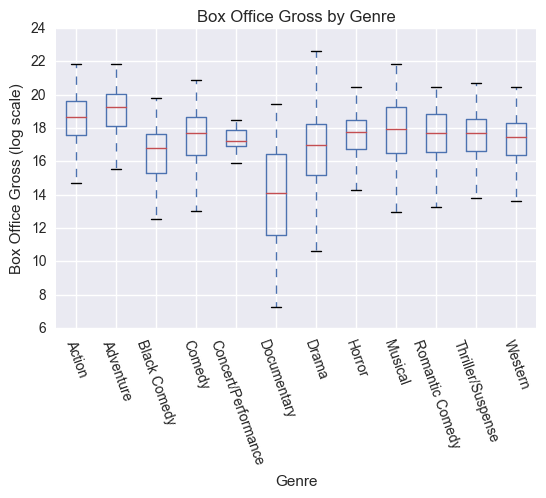

In [76]:
movies[['genre', 'intgross_log']].boxplot(by='genre')
plt.title('Box Office Gross by Genre')
plt.ylabel('Box Office Gross (log scale)')
plt.xlabel('Genre')
plt.xticks(rotation=-70)
plt.suptitle('')

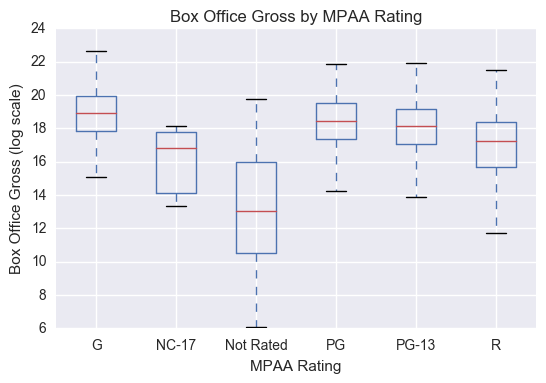

In [60]:
movies[['rating', 'intgross_log']].boxplot(by='rating')
plt.title('Box Office Gross by MPAA Rating')
plt.ylabel('Box Office Gross (log scale)')
plt.xlabel('MPAA Rating')
plt.suptitle('')
#plt.ylim(0,1e9);

(array([1, 2, 3, 4, 5, 6, 7]), <a list of 7 Text xticklabel objects>)

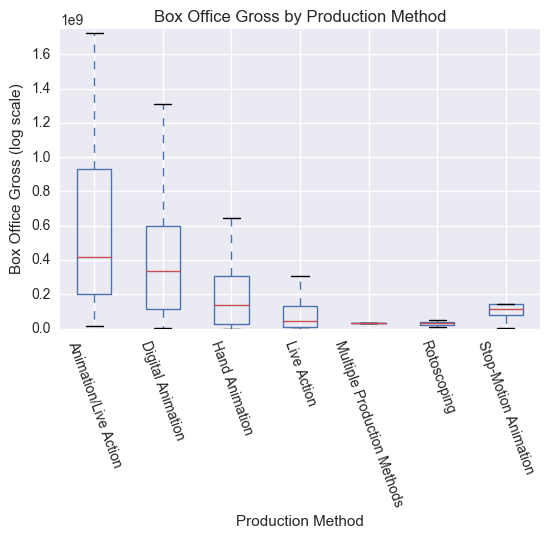

In [77]:
movies[['prod_method', 'intgross_adj']].boxplot(by='prod_method')
plt.title('Box Office Gross by Production Method')
plt.ylabel('Box Office Gross (log scale)')
plt.xlabel('Production Method')
plt.suptitle('')
plt.ylim(0, 1.75e9)
plt.xticks(rotation=-70)

In [13]:
import datetime

# Create variable to capture big release months
movies['releasemonth'] = movies.releasedate.apply(lambda x: x.month)
movies['releasewk'] = movies.releasedate.apply(lambda x: int(x.strftime('%W')))
monthly = movies.groupby('releasemonth').profit.agg(['mean', 'sem', 'count'])

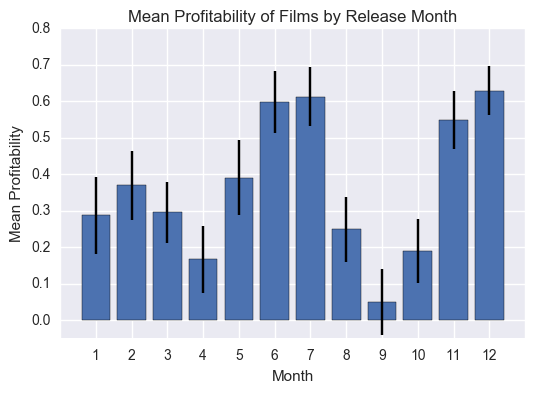

In [81]:
plt.bar(monthly.index, monthly['mean'], yerr=monthly['sem'], ecolor='black', align='center')
plt.xlim((0,13))
plt.ylim(-.05,.8)
plt.xticks(np.arange(0,14), ['']+range(1,13)+['']);
plt.title('Mean Profitability of Films by Release Month')
plt.xlabel('Month')
plt.ylabel('Mean Profitability')

In [14]:
# Save 'release month profitability' feature back to movies
movies = movies.merge(monthly['mean'].to_frame(name='re_mo_prof'), how='left', left_on='releasemonth', right_index=True)

In [15]:
# Delete cast, prod_comp, and prod_nat data that aren't in the movies I've kept
cast = cast[cast.index.isin(movies.index)]
prod_cast = prod_cast[prod_cast.index.isin(movies.index)]
prod_nats = prod_nats[prod_nats.index.isin(movies.index)]
prod_comps = prod_comps[prod_comps.index.isin(movies.index)]

In [16]:
# Create table with scores for each cast member based on how many movies they were in
cast_scores = pd.DataFrame(cast.cast_id.value_counts())
cast_scores.columns = ['score']

cast_with_scores = cast.merge(cast_scores, how='left', left_on='cast_id', right_index=True)

# Create table with size of cast for each movie
movies['cast_size'] = cast.groupby(level=0).size()
movies['cast_size_log'] = np.log(movies.cast_size)


In [17]:
movies['cast_score'] = cast_with_scores.groupby(level=0)['score'].sum()
movies.cast_score = movies.cast_score/movies.cast_size
movies_with_cast = movies[~np.isnan(movies.cast_score)]

In [18]:
# Check gross on most common production nations
top_prod_nats = prod_nats.prod_nat.value_counts().reset_index()[:10]['index']
prod_nats['top_prod_nat'] = prod_nats.prod_nat.isin(top_prod_nats)

top_prod_nats_merge = prod_nats.groupby(level=0).top_prod_nat.max()
top_prod_nats_merge = top_prod_nats_merge.astype(int)
movies = movies.merge(top_prod_nats_merge.to_frame(name='top_prod_nat'), how='left', left_index=True, right_index=True)

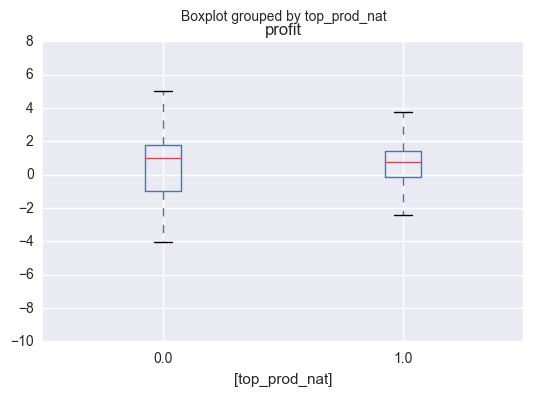

In [19]:
movies[['top_prod_nat', 'profit']].boxplot(by='top_prod_nat')
#plt.ylim(0,.5e9)

In [20]:
# Plot top production companies' avg. profits

top_prod_comps = prod_comps.prod_comp.value_counts().reset_index()[:23]['index'].str.strip()
prod_comps_merged = prod_comps.merge(movies.profit.to_frame(name='profit'), how='left', left_index=True, right_index=True)

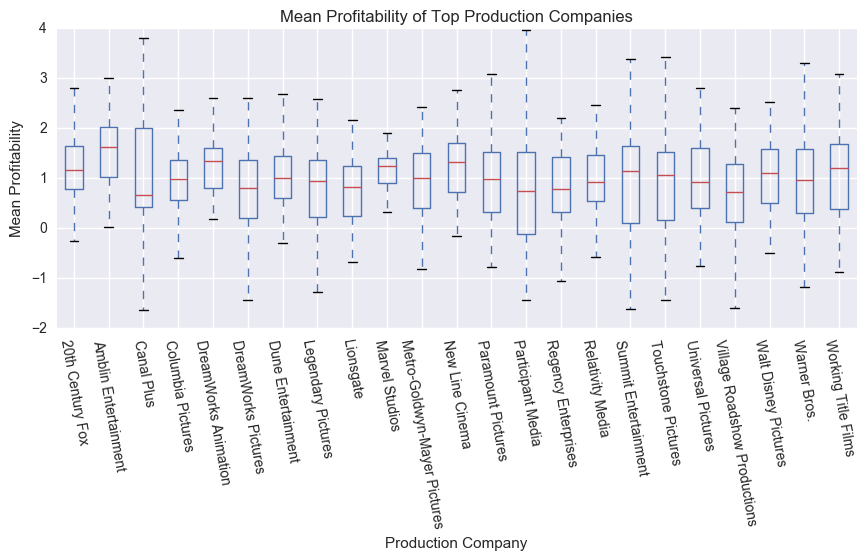

In [123]:
prod_comps_merged[prod_comps_merged.prod_comp.isin(top_prod_comps)].boxplot(by='prod_comp', figsize=(10,4))
plt.ylim(-2,4)
plt.xticks(np.arange(1, 24), rotation=-80)
plt.title('Mean Profitability of Top Production Companies')
plt.xlabel('Production Company')
plt.ylabel('Mean Profitability')
plt.suptitle('')

In [21]:
prod_comp_ranks = prod_comps.prod_comp.value_counts().reset_index()
prod_comp_ranks.columns = ['prod_comp', 'rank']

In [22]:
prod_comps_ranked = prod_comps_merged.merge(prod_comp_ranks, how='left', on='prod_comp')

In [23]:
prod_comps_ranked['colfromindex'] = prod_comps_merged.index
movie_top_prod_comp = prod_comps_ranked.sort_values(['colfromindex', 'rank'], ascending=(True, False)).groupby('colfromindex').head(1)

prod_comps_ranked.set_index('colfromindex', inplace=True)
movie_top_prod_comp.set_index('colfromindex', inplace=True)

In [24]:
movies = movies.merge(movie_top_prod_comp.prod_comp.to_frame(name='top_prod_comp'), how='left', left_index=True,
                                                             right_index=True)

In [25]:
prod_comps_prof_ts = prod_comps_merged.merge(movies.releasedate.to_frame(name='releasedate'),
                                             how='left', left_index=True, right_index=True)

In [26]:
prod_comps_prof_ts = prod_comps_prof_ts.set_index('prod_comp', append=True, drop=False)

In [27]:
rolling_avg = prod_comps_prof_ts.sort_values(['prod_comp', 'releasedate']).\
    groupby('prod_comp').shift().rolling(window = 5, min_periods=2).profit.mean()

prod_comps_prof_ts = prod_comps_prof_ts.merge(rolling_avg.to_frame(), how='left', left_index=True,
                          right_index=True)

In [28]:
prod_comp_prof_overall_avg = prod_comps_prof_ts.profit_y.mean()

In [29]:
movies['movie_index'] = movies.index

In [30]:
movies = movies.merge(prod_comps_prof_ts.profit_y.to_frame(name='prod_comp_prof'), how='left',
                      left_on=['movie_index', 'top_prod_comp'],
                     right_index=True)

In [31]:
movies.drop('movie_index', axis=1, inplace=True)

In [32]:
# Fix data for movies by prod comps that only have done 1 movie:
movies.loc[(~pd.isnull(movies.top_prod_comp)) & (pd.isnull(movies.prod_comp_prof)), 'prod_comp_prof'] = prod_comp_prof_overall_avg

In [33]:
# Fix weirdo dupes
dupes = movies.loc[4928]
dupes = dupes.iloc[0,:]
movies.drop(4928, inplace = True)
movies.loc[4928] = dupes.tolist()

In [34]:
# Repeat the above for production cast
prod_cast_scores = pd.DataFrame(prod_cast.cast_id.value_counts())
prod_cast_scores.columns = ['score']

prod_cast_with_scores = prod_cast.merge(prod_cast_scores, how='left', left_on='cast_id', right_index=True)

movies['prod_cast_size'] = prod_cast.groupby(level=0).size()

In [35]:
movies['prod_cast_score'] = prod_cast_with_scores.groupby(level=0)['score'].sum()
movies.prod_cast_score = movies.prod_cast_score/movies.prod_cast_size
movies['prod_cast_score_log'] = np.log(movies.prod_cast_score)
movies_with_cast_crew = movies[~np.isnan(movies.cast_score) & ~np.isnan(movies.prod_cast_score) & 
                           ~np.isnan(movies.prod_comp_prof)]  # I lose 1300 movies due to not having prod_comp_prof!

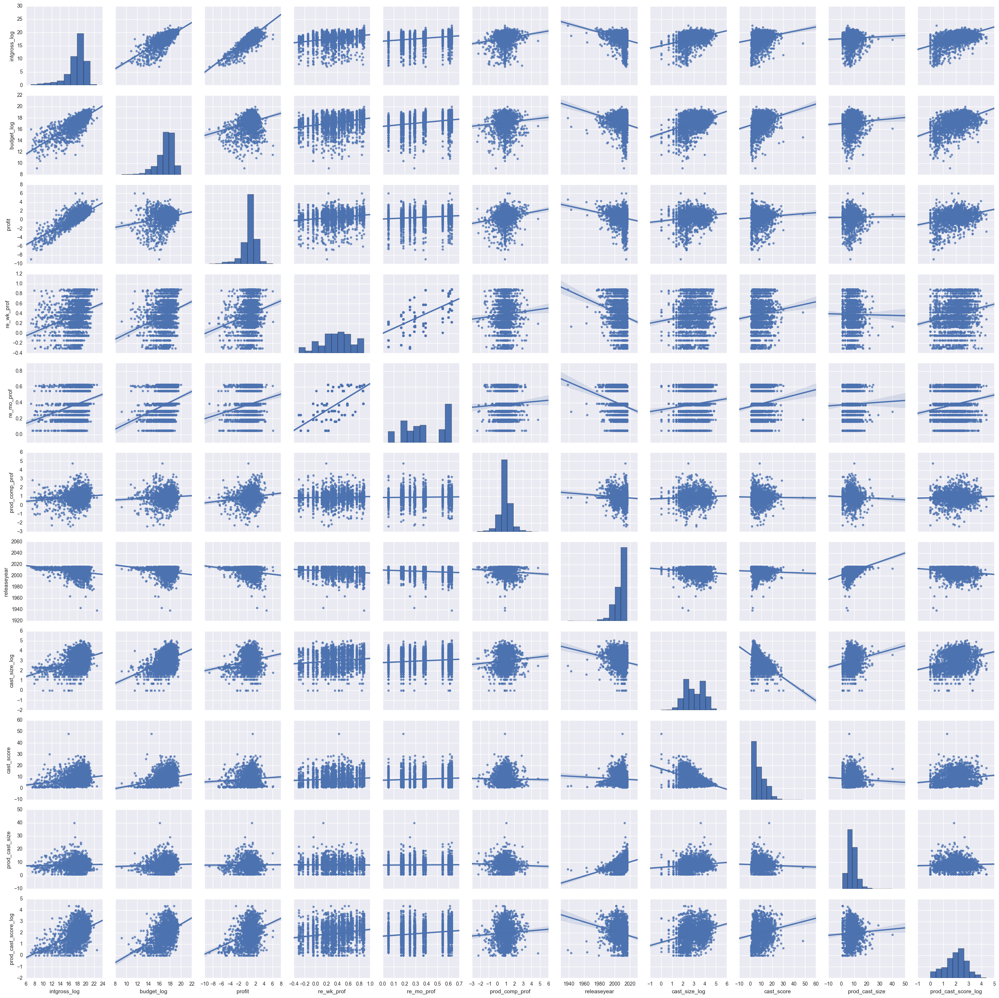

In [36]:
# sns.pairplot(movies_with_cast_crew.loc[movies_with_cast_crew.releaseyear >= 1998, 
#         ['intgross_log', 'budget_log','profit', 'releaseyear', 'cast_size_log', 'cast_score', 'prod_cast_size',
#          'prod_cast_score_log']],
#              kind='reg');

sns.pairplot(movies_with_cast_crew[['intgross_log', 'budget_log','profit', 're_mo_prof',
                                    'prod_comp_prof',\
                                    'releaseyear', 'cast_size_log',\
                                    'cast_score', 'prod_cast_size', 'prod_cast_score_log']], kind='reg');

In [58]:
movies_with_cast_crew[movies_with_cast_crew.releaseyear >= 1998].shape

(2112, 28)

In [36]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LassoCV
from sklearn.model_selection import cross_val_score
from sklearn import preprocessing

In [37]:
print movies_with_cast_crew.info()
movies_x = movies_with_cast_crew[['budget_log', 'cast_size_log', 'cast_score', 'prod_cast_size',
                                  'prod_cast_score_log', 're_mo_prof', 'prod_comp_prof']]

movies_y = movies_with_cast_crew.intgross_log

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2279 entries, 0 to 4928
Data columns (total 30 columns):
releasedate            2279 non-null datetime64[ns]
movie                  2279 non-null object
budget                 2279 non-null int64
domgross               2279 non-null int64
intgross               2279 non-null int64
url                    2279 non-null object
releaseyear            2279 non-null int64
rating                 2279 non-null object
runtime                2141 non-null float64
genre                  2277 non-null object
franchise              2279 non-null object
prod_method            2277 non-null object
rating_desc            2009 non-null object
intgross_adj           2279 non-null float64
budget_adj             2279 non-null float64
intgross_log           2279 non-null float64
budget_log             2279 non-null float64
profit                 2279 non-null float64
releasemonth           2279 non-null int64
releasewk              2279 non-null int64
re_mo

In [38]:
movies_cats = pd.get_dummies(movies_with_cast_crew[['genre', 'rating', 'prod_method']])
movies_x_all = movies_x.merge(movies_cats, how='left', left_index=True, right_index=True)
movies_x_all.head()

,budget_log,cast_size_log,cast_score,prod_cast_size,prod_cast_score_log,re_mo_prof,prod_comp_prof,genre_Action,genre_Adventure,genre_Black Comedy,genre_Comedy,genre_Concert/Performance,genre_Documentary,genre_Drama,genre_Horror,genre_Musical,genre_Romantic Comedy,genre_Thriller/Suspense,genre_Western,rating_G,rating_NC-17,rating_Not Rated,rating_PG,rating_PG-13,rating_R,prod_method_Animation/Live Action,prod_method_Digital Animation,prod_method_Hand Animation,prod_method_Live Action,prod_method_Multiple Production Methods,prod_method_Rotoscoping,prod_method_Stop-Motion Animation
0,19.98,3.69,5.35,6.00,2.72,0.63,1.19,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
1,19.55,3.66,7.67,9.00,2.64,0.63,1.43,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
2,19.67,3.09,14.32,8.00,2.71,0.39,0.85,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0
3,19.53,4.34,2.45,8.00,2.13,0.55,0.80,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0
4,19.48,2.64,22.07,10.00,2.78,0.61,1.57,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0


In [39]:
x_train, x_test, y_train, y_test = train_test_split(movies_x_all, movies_y, test_size=0.3, random_state=42) # Split train/test
x_train_normed = preprocessing.normalize(x_train, axis=0, norm='max')  #Normalize train data

In [40]:
lasso = LassoCV() # uses 3 folds (default) to find a good lambda
model1 = lasso.fit(x_train_normed, y_train)

In [41]:
print lasso.score(x_train_normed, y_train)

0.646345797861


In [89]:
x_train.shape

(1595, 32)

In [42]:
x_train_norm_i = pd.DataFrame(x_train_normed, index = x_train.index)
predict_train = pd.Series(lasso.predict(x_train_norm_i), index = x_train_norm_i.index)

resid = y_train - predict_train

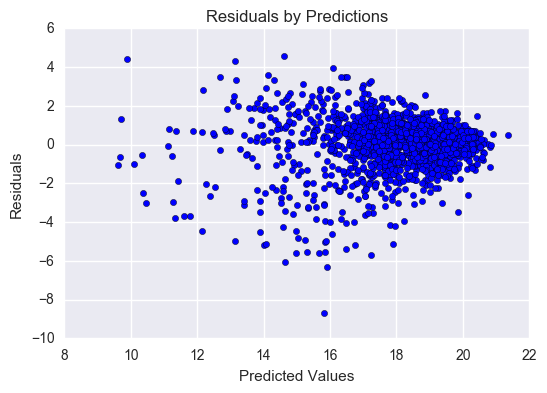

In [91]:
plt.scatter(predict_train, resid) #plot residuals against predictions
plt.title('Residuals by Predictions')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

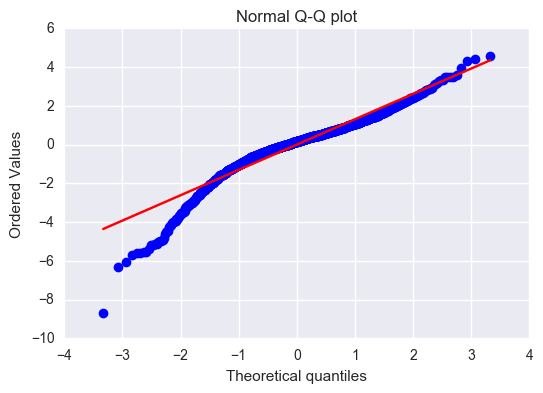

In [92]:
import scipy.stats as stats

stats.probplot(resid, dist="norm", plot=plt)
plt.title("Normal Q-Q plot")

In [43]:
test = movies.merge(resid.to_frame(name='resid'), how='left', left_index = True, right_index = True)

In [65]:
def coef_df(model, features = None, categories = None):
    '''
    Creates a dataframe of coefficients from a fitted model
    
    model: a fitted model from sklearn (LogisticRegression object, Lasso object, etc.)
    features: optional list of feature names. Must be in the same order as when you fit your model.
    categories: list of category names, order does not matter. Must supply if your model object contains
                multiple models (e.g. multiclass LogisticRegression). Leave empty if your model object
                contains one model (e.g. Linear Regression, binary LogisticRegression, etc.)
    '''
    if categories is not None:
        columns = sorted(categories)
    else:
        columns = ['coefs']

    coef_matrix = np.transpose(model.coef_)
    coef_frame = pd.DataFrame(coef_matrix, columns=columns)
    
    if features is not None:
        coef_frame['feature'] = features
        coef_frame.set_index('feature', inplace=True)
    
    return coef_frame


In [94]:
coef_df = pd.DataFrame({'feature':x_train.columns, 'coef':model1.coef_})
coef_df.reindex(coef_df.coef.abs().sort_values(ascending = False, inplace=False).index)

,coef,feature
0,16.55,budget_log
21,-2.31,rating_Not Rated
4,1.99,prod_cast_score_log
1,0.73,cast_size_log
6,0.61,prod_comp_prof
14,0.57,genre_Horror
5,0.41,re_mo_prof
28,-0.35,prod_method_Live Action
24,-0.34,rating_R
26,0.26,prod_method_Digital Animation


In [97]:
from sklearn.model_selection import learning_curve

In [98]:
train_sizes, train_scores, valid_scores = learning_curve(
    lasso, x_train_normed, y_train, cv=6)
 
train_scores_mean = np.mean(train_scores, axis=1)
valid_scores_mean = np.mean(valid_scores, axis=1)

(0, 1400)

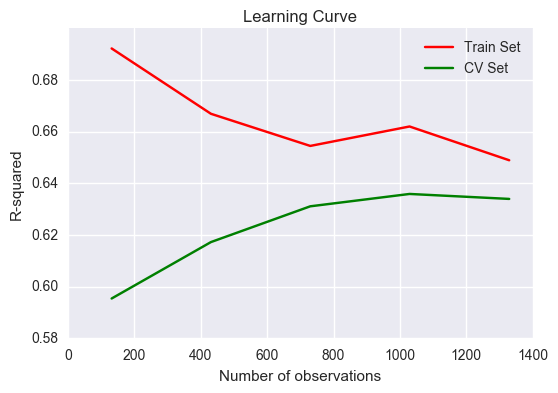

In [99]:
plt.plot(train_sizes, train_scores_mean, 'r', label='Train Set')
plt.plot(train_sizes, valid_scores_mean, 'g', label='CV Set');
plt.legend()
plt.ylabel('R-squared')
plt.xlabel('Number of observations')
plt.title('Learning Curve')
plt.xlim(0, 1400)

In [100]:
x_test_normed = preprocessing.normalize(x_test, axis=0, norm='max')

In [101]:
lasso.score(x_test_normed, y_test)

0.65615017133596165

In [ ]:
# TIME ESTIMATE  - 2.5 hours for figuring out how to do error analysis, doing it, and implementing changes
# TIME REALITY - 1.5 hours for figure it out, and analyzing a few things (not many changes to make)

In [104]:
df_list = [x_train, y_train, x_train_normed]

with open('luthor_train_data.pkl', 'wb') as picklefile:
    pickle.dump(df_list, picklefile)